# Evaluating biophysically detailed multi-compartmental models

[Tutorial 1.1: Simulating biophysically detailed multi-compartmental models](./1.1%20Simulation.ipynb) outlined how to run 5 stimulus protocols ($bAP$, $BAC$ and $3$ step currents) in silico.

This tutorial will show how to use ISF in order to compare the cell's in silico response to an empirical distribution of electrophysiological parameters, i.e. the simulation **objectives**. Quantifying how far off the responses are compared to this distribution will be done with the [Evaluator](../../api_reference/biophysics_fitting/evaluator/index.rst) object.

In addition to quantifying the response and comparing it to empirical values, this tutorial will also show how to visually inspect simulations using the [visualize](../../api_reference/visualize//index.rst) package.

To get started, adapt the path below to your desired output directory:

In [1]:
from pathlib import Path
tutorial_output_dir = f"{Path.home()}/isf_tutorial_output"  # <-- Change this to your desired output directory

In [2]:
import Interface as I
%matplotlib inline

db = I.DataBase(tutorial_output_dir).create_sub_db("neuron_modeling")

[INFO] ISF: Current version: heads/data+0.g1077bcf8.dirty
[INFO] ISF: Current pid: 227965
[INFO] ISF: Loading mechanisms:


--No graphics will be displayed.


[ATTENTION] ISF: The source folder has uncommited changes!



[INFO] ISF: Loaded modules with __version__ attribute are:
IPython: 8.12.2, Interface: heads/data+0.g1077bcf8.dirty, PIL: 10.4.0, _brotli: 1.0.9, _csv: 1.0, _ctypes: 1.1.0, _curses: b'2.2', _decimal: 1.70, argparse: 1.1, backcall: 0.2.0, blosc: 1.11.1, bluepyopt: 1.9.126, brotli: 1.0.9, certifi: 2024.08.30, cffi: 1.17.0, charset_normalizer: 3.4.0, click: 7.1.2, cloudpickle: 3.1.0, colorama: 0.4.6, comm: 0.2.2, csv: 1.0, ctypes: 1.1.0, cycler: 0.12.1, cytoolz: 0.12.3, dash: 2.18.2, dask: 2.30.0, dateutil: 2.9.0, deap: 1.4, debugpy: 1.8.5, decimal: 1.70, decorator: 5.1.1, defusedxml: 0.7.1, distributed: 2.30.0, distutils: 3.8.20, django: 1.8.19, entrypoints: 0.4, executing: 2.1.0, fasteners: 0.17.3, flask: 1.1.4, fsspec: 2024.10.0, future: 1.0.0, greenlet: 3.1.1, idna: 3.10, ipaddress: 1.0, ipykernel: 6.29.5, ipywidgets: 8.1.5, isf_pandas_msgpack: 0.2.3, itsdangerous: 1.1.0, jedi: 0.19.1, jinja2: 2.11.3, joblib: 1.4.2, json: 2

The [previous tutorial](./1.1%20Simulation.ipynb) showed how to set up a Simulator object, which we saved to re-use here. Let's load it back in to evaluate how well these models have performed

In [3]:
simulator = db['simulator']
voltage_traces = db['voltage_traces']

## The ISF [Evaluator](../../api_reference/biophysics_fitting/evaluator/index.rst)

ISF implements an [Evaluator](../../api_reference/biophysics_fitting/evaluator/index.rst) object to evaluate voltage traces. It can be configured once with empirical values on voltage traces and re-used afterwards.

In [4]:
from biophysics_fitting.hay.default_setup import get_Evaluator

evaluator = get_Evaluator(step=True, interpolate_voltage_trace=False)

In [5]:
evaluation = evaluator.evaluate(voltage_traces)
evaluation

{'BAC_APheight.check_1AP': 'True',
 'BAC_APheight.raw': array([33.66002227, 29.8688259 , 23.41371875]),
 'BAC_APheight.normalized': 1.0076752949319177,
 'BAC_APheight': 1.0076752949319177,
 'BAC_ISI.check_2_or_3_APs': 'True',
 'BAC_ISI.check_repolarization': 'True',
 'BAC_ISI.raw': 9.936833063034726,
 'BAC_ISI.normalized': 0.04207239994684291,
 'BAC_ISI': 0.04207239994684291,
 'BAC_caSpike_height.check_1_Ca_AP': 'True',
 'BAC_caSpike_height.check_>=2_Na_AP': 'True',
 'BAC_caSpike_height.check_ca_max_after_nth_somatic_spike': 'True',
 'BAC_caSpike_height.raw': 8.413835125674638,
 'BAC_caSpike_height.normalized': 0.6629272148325343,
 'BAC_caSpike_height': 0.6629272148325343,
 'BAC_caSpike_width.check_1_Ca_AP': 'True',
 'BAC_caSpike_width.raw': 38.31055111593054,
 'BAC_caSpike_width.normalized': 0.6933473353783755,
 'BAC_caSpike_width': 0.6933473353783755,
 'BAC_spikecount.raw': 3,
 'BAC_spikecount.normalized': 0.0,
 'BAC_spikecount': 0.0,
 'BAC_ahpdepth.check_2AP': 'True',
 'BAC_ahpdepth

`evaluation` contains a lot of information. Most are self-explanatory, but not all, so here is a small overview.

|Suffix|Meaning|
|---|---|
|`.check`|Check if certain conditions are met before moving on to evaluation. E.g. it does not make sense to measure the AP height of the second AP during the BAC stimulus, if there is no burst firing at all.|
|`.raw`|The measured values for all objectives are saved under `.raw` variables. If multiple values exists for some objective, then this `.raw` value will be an array, but the mean is taken for further evaluation.
|`.normalized`|Scales objective between $0$ and $1$.|
|No suffix|The objective in units of $\sigma$ relative to the empirically observed mean $\mu$.

The step current objectives have some cryptic acronyms as well:

|Acronym|Meaning|
|---|---|
|`mf`|Spike frequency|
|`AI` |Adaptation Index|
|`ISIcv`|Interspike Interval Coefficient of Variation|
|`DI`|Initial burst ISI|
|`TTFS`|First spike latency|
|`APh`|AP peak|
|`fAHPd` |Fast AHP Depth|
|`sAHPd` |Slow AHP Depth|
|`sAHPt` |Slow AHP Time|
|`APw` |AP half-width|

Exactly how much each objective is allowed to deviate from its empirical mean is defined in each evaluator class, associated with a stimulu protocol. See for example the `BAC` class in [biophysics_fitting.hay.evaluation](../../api_reference/biophysics_fitting/hay/evaluation/index.rst)

Let's clean up this data a bit and plot out their deviation from the mean.

In [6]:
# only plot out sigma from mean, not raw or normalized values - also no checks.
sigma_mean = {k: v for k, v in evaluation.items() if \
    not k.endswith('.raw') and \
    not k.endswith('.normalized') and \
    not 'check' in k and \
    not k.endswith('err') and\
    not "1BAC" in k}
sigma_mean

{'BAC_APheight': 1.0076752949319177,
 'BAC_ISI': 0.04207239994684291,
 'BAC_caSpike_height': 0.6629272148325343,
 'BAC_caSpike_width': 0.6933473353783755,
 'BAC_spikecount': 0.0,
 'BAC_ahpdepth': 0.1392807122615114,
 'bAP_spikecount': 0.0,
 'bAP_APheight': 1.7319785547438031,
 'bAP_APwidth': 2.0332755883802065,
 'bAP_att2': 1.2386558591918138,
 'bAP_att3': 1.6057535361393405,
 'mf1': 1.7045454545454546,
 'AI1': 0.5066062458183707,
 'ISIcv1': 1.518210025496329,
 'DI1': 0.42387682153444994,
 'TTFS1': 1.5595241133692064,
 'APh1': 0.7275205487209074,
 'fAHPd1': 1.8003008765264834,
 'sAHPd1': 1.0151163975923705,
 'sAHPt1': 0.5495925224841391,
 'APw1': 2.117487156301,
 'mf2': 0.0,
 'AI2': 1.9148094224163767,
 'ISIcv2': 0.5106508765351007,
 'DI2': 1.4694531512688596,
 'TTFS2': 0.125569753657245,
 'APh2': 0.9342151521837061,
 'fAHPd2': 1.4198796199388009,
 'sAHPd2': 0.3243466774696222,
 'sAHPt2': 1.01641064338122,
 'APw2': 1.5324457777590226,
 'mf3': 2.2500225002250023,
 'AI3': 1.7013934288413

In [7]:
def translate_objective(objective):
    """
    A simple map between objective acronyms and their full name
    """
    step_map = {
        'mf': "Spike frequency",
        'AI': 'Adaptation Index',
        'ISIcv': "Interspike Interval \n Coefficient of Variation",
        'DI': "Initial burst ISI",
        'TTFS': "First spike latency",
        'APh': "AP peak",
        'fAHPd': "Fast AHP Depth",
        'sAHPd': "Slow AHP Depth",
        'sAHPt': "Slow AHP Time",
        'APw': "AP half-width",
    }
    if not "bAP" in objective and not "BAC" in objective:
        # must be step current objective
        t = step_map[objective[:-1]]
    else:
        t = objective
    return t

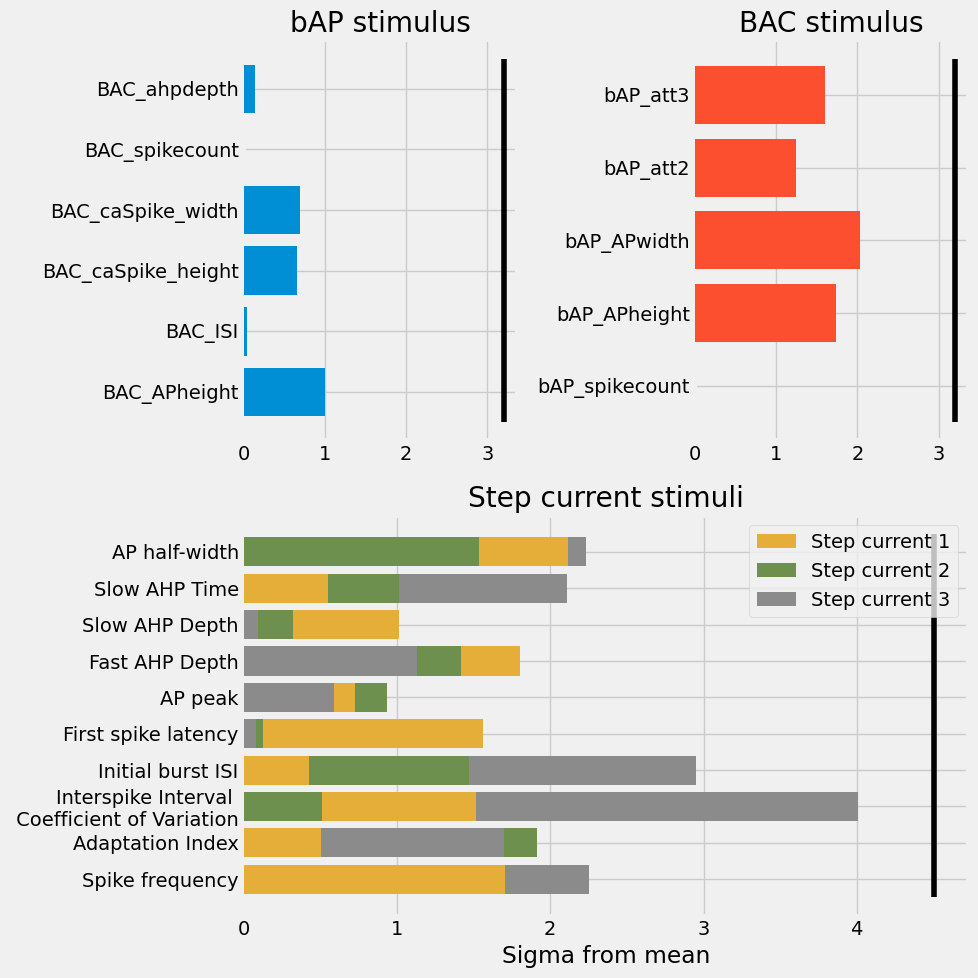

In [8]:
from collections import OrderedDict
I.plt.style.use("fivethirtyeight")
colors = I.plt.rcParams['axes.prop_cycle'].by_key()['color']
fig = I.plt.figure(figsize=(10, 10))
gs = fig.add_gridspec(2,2)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])

for k, v in sigma_mean.items():
    if "BAC" in k:
        c = colors[0]
        ax = ax1
        label="BAC"
    elif 'bAP' in k:
        c = colors[1]
        ax = ax2
        label="bAP"
    else:
        label = "Step current {}".format(k[-1])
        c = colors[int(k[-1])+1]
        ax = ax3
    ax.barh(y=translate_objective(k), width=v, zorder=5-v, label=label, color=c)

ax1.vlines(3.2, ymin=-.5, ymax=5.5, color='k')
ax2.vlines(3.2, ymin=-.5, ymax=4.5, color='k')
ax3.vlines(4.5, ymin=-.5, ymax=9.5, color='k')

ax1.set_title("bAP stimulus")
ax2.set_title("BAC stimulus")
ax3.set_title("Step current stimuli")
ax3.set_xlabel("Sigma from mean")

handles, labels = I.plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
I.plt.legend(by_label.values(), by_label.keys(), loc="best")
fig.tight_layout()

I.plt.show()

All objectives are well within the pre-defined bounds. most are even under $2 \sigma$ from the mean!

## Visualization

How much did current ended up flowing through the ion channels? Let's plot out a spatial integration of all the current types in the apical dendrite. Let's take a $BAC$ current injection as an example simulation.

In [9]:
from getting_started import example_data_dir
model_db = I.DataBase(I.os.path.join(example_data_dir, "simulation_data", "biophysics"))
example_models = model_db['example_models']
biophysical_parameter_names = [e for e in example_models.columns if "ephys" in e or e == "scale_apical.scale"]
params = example_models[biophysical_parameter_names].iloc[0]

In order to know which currents flow through the membrane, we need to record this. We can configure the simulator to record `range variables` with a `cell_modify_function`:

In [10]:
cell, biophysical_parameters = simulator.setup.get(params)
record_vars = [
    'NaTa_t.ina',
    'Ca_HVA.ica',
    'Ca_LVAst.ica',
    'SKv3_1.ik',
    'SK_E2.ik',
    'Ih.ihcn',
    'Im.ik'
]

def record_rangevars(cell, params):
    for rv in record_vars:
        cell.record_range_var(rv)
    return cell
    
simulator.setup.cell_modify_funs.append(('BAC.record_range_vars', record_rangevars))
cell, _ = simulator.get_simulated_cell(biophysical_parameters, stim="BAC")

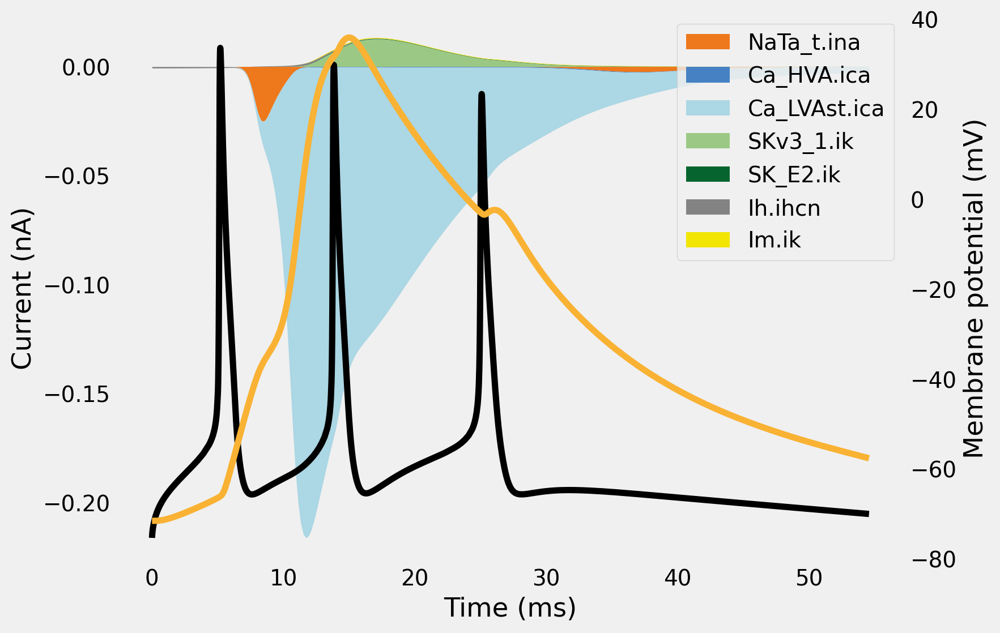

In [11]:
from visualize.current_visualizer import CurrentAnalysis
ca = CurrentAnalysis(cell, rangeVars = record_vars)
fig = ca.plot_areas(plot_voltage = True, t_stim=295)
fig.set_size_inches(8,6)
for ax in fig.axes: ax.grid(False)

The black and orange line denote membrane voltage at the soma and dendritic recording location respectively. The filled in areas are a spatial sum of ionic current across time: $I_{ion}(t) = \sum_{dendrites} \int_x I_{ion} dx$

Bear in mind that the first spike is mostly due to somatic currents. While these are very much present, they are not very visible on the plot above, since they pale in comparison to the total amount of current through all dendrites. You can plot again on a logscale to verify this.

### Animating the membrane voltage

So far, we have only visualized the somatic membrane potential. Now, we create a short animation, where the whole dendrite is visualized.


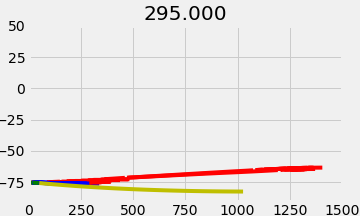
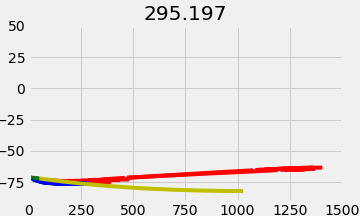
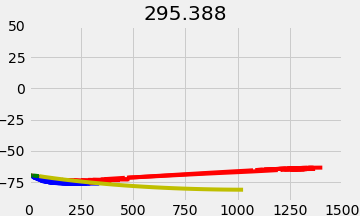
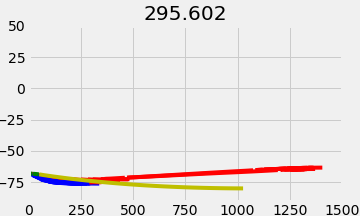
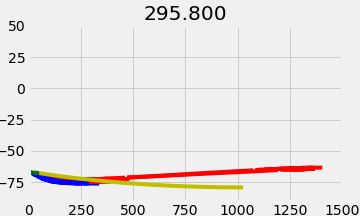
...
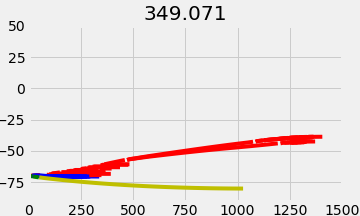
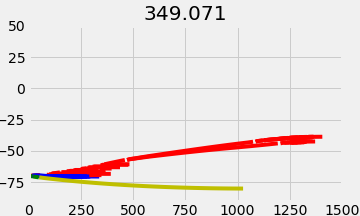
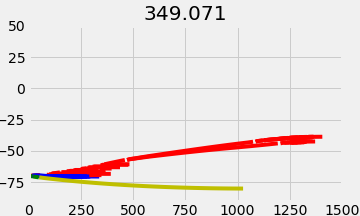
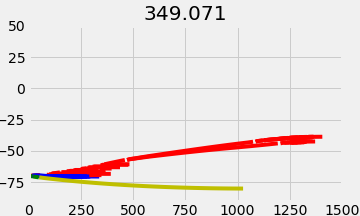
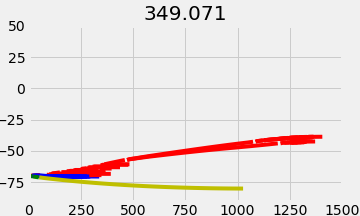

In [12]:
if not 'burst_trail_video' in db.keys():
    I.cell_to_animation(
        cell,
        xlim = [0,1500],
        ylim = [-90, 50],
        tstart = 295,
        tend = 350,
        tstep = 0.2,
        outdir = db.create_managed_folder('burst_trail_video'))
I.display_animation(db['burst_trail_video'].join('*', '*.png'), embedded=True);

If you want to visualize the entire dendritic tree, that's also possible, although a bit slower. Here, we use Dask to parallellize frame generation of the membrane voltage across the entire dendritic tree. 
You can use the +/- buttons to cycle through the frames faster or slower. Alternatively, you play around with the `t_step` parameter to create mre or less frames per time interval.


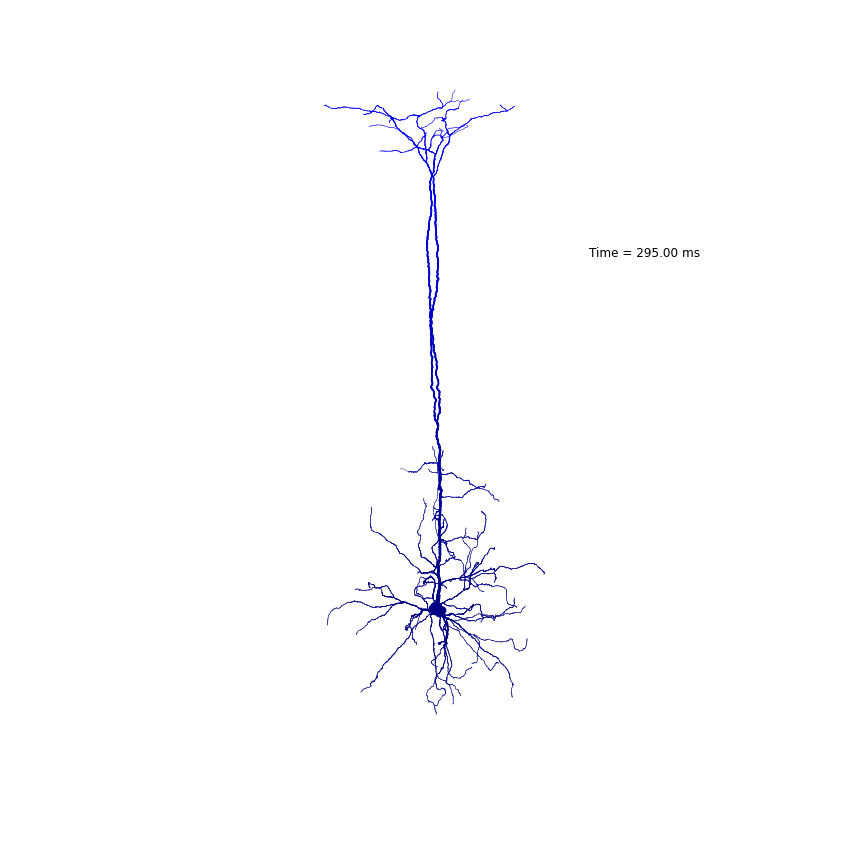
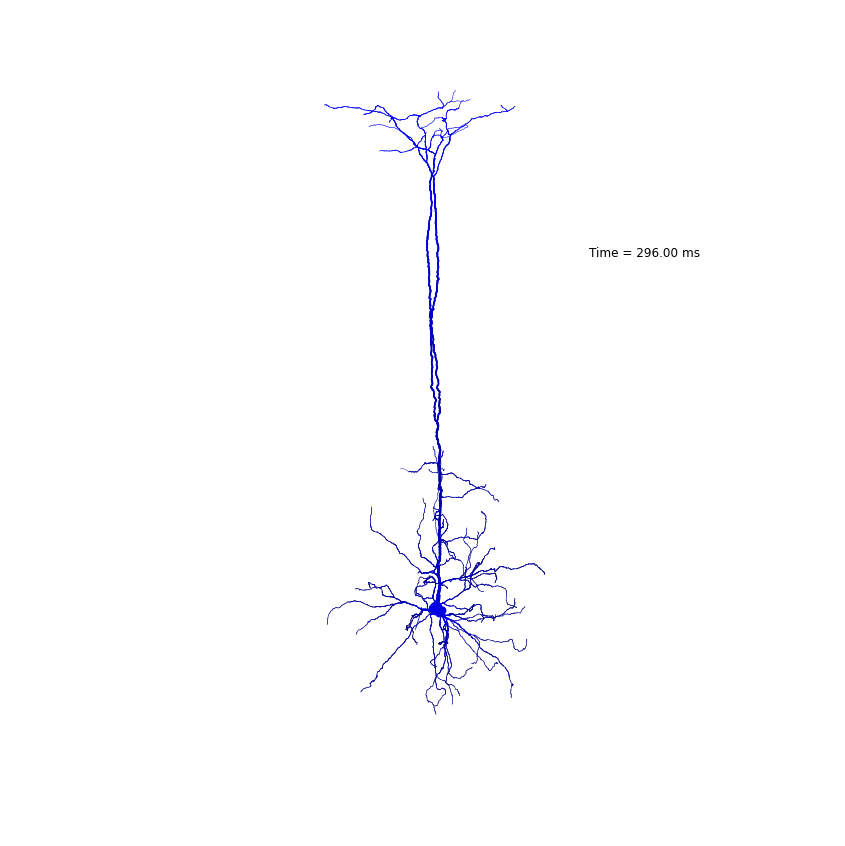
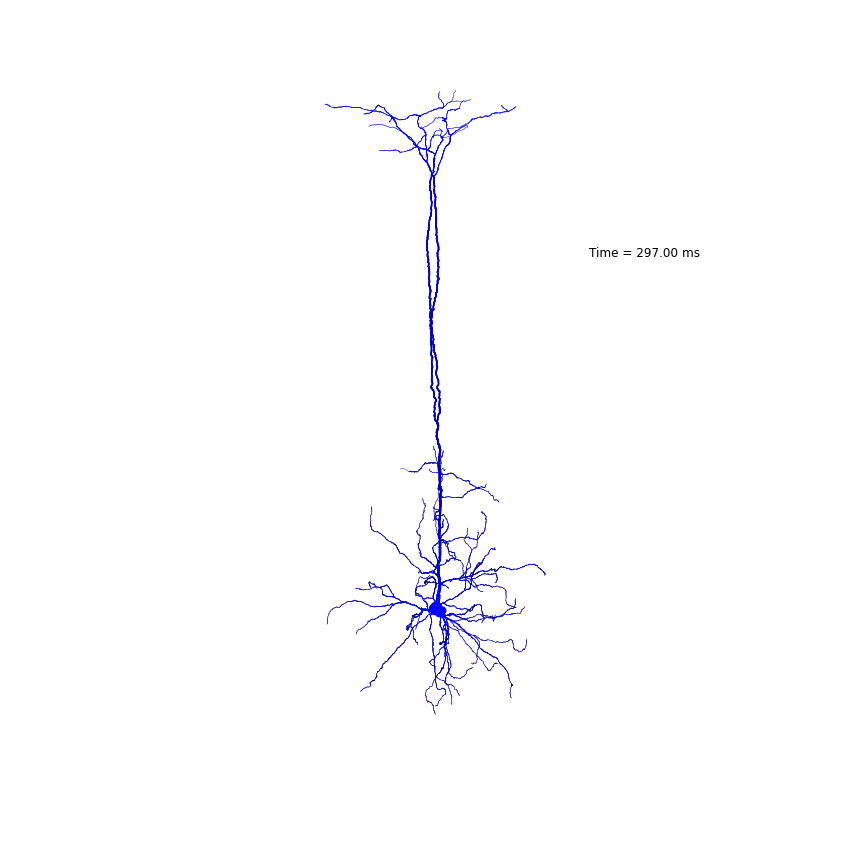
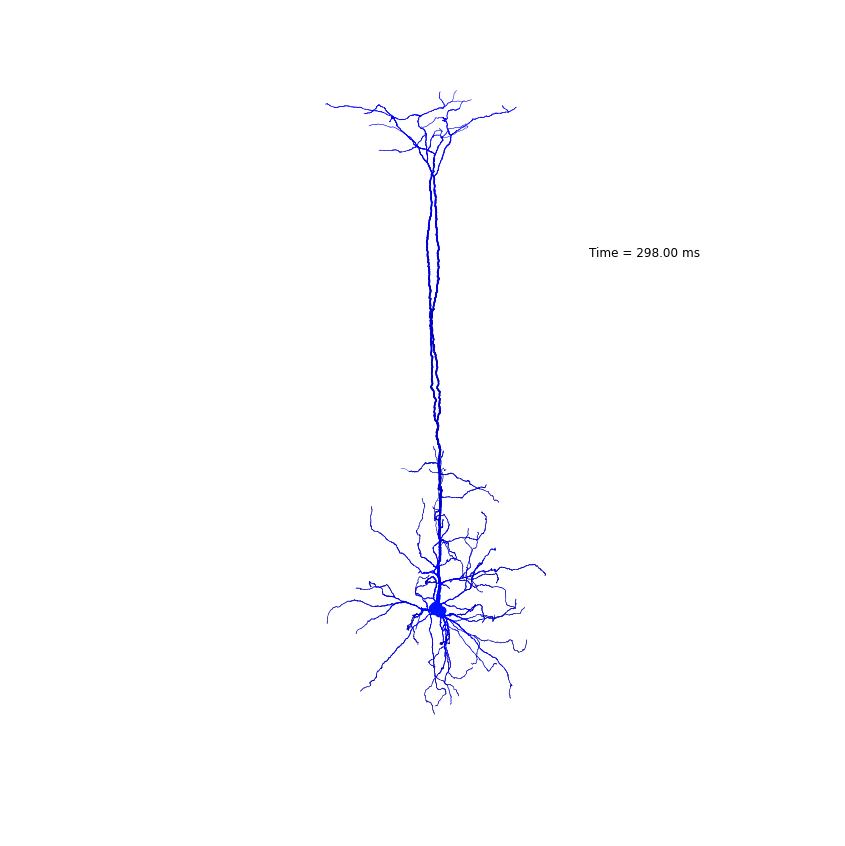
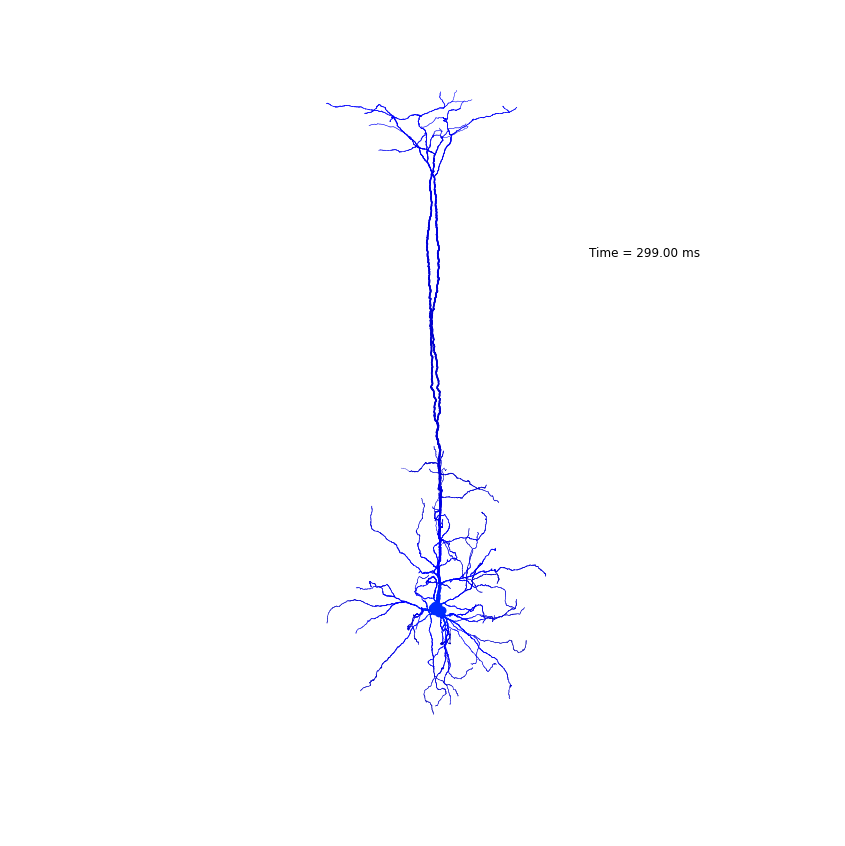
...
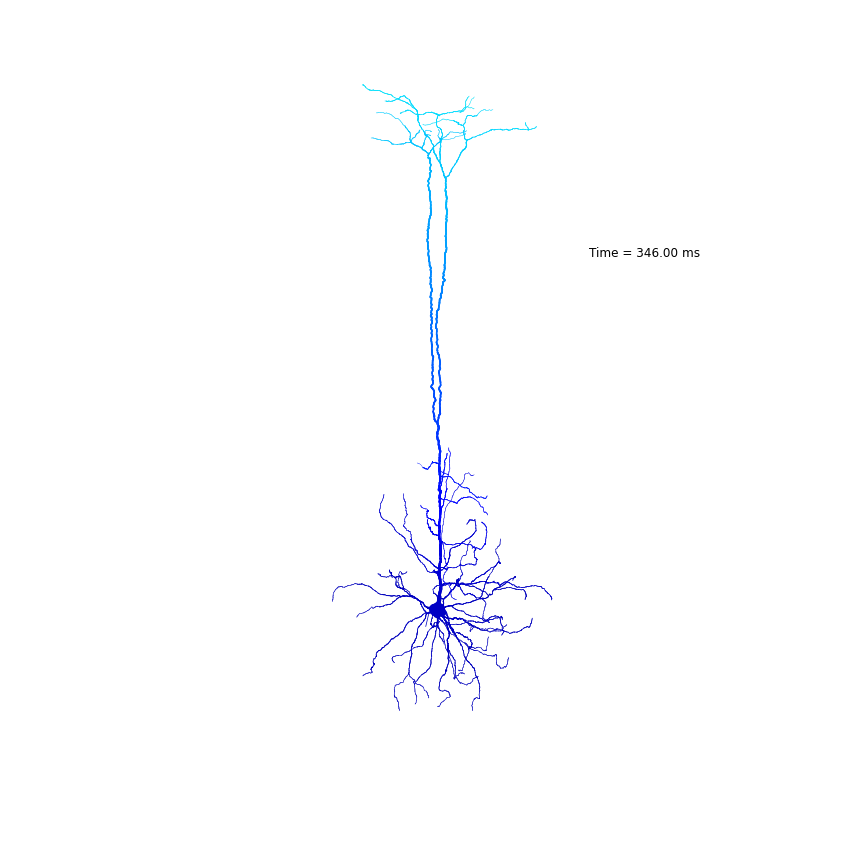
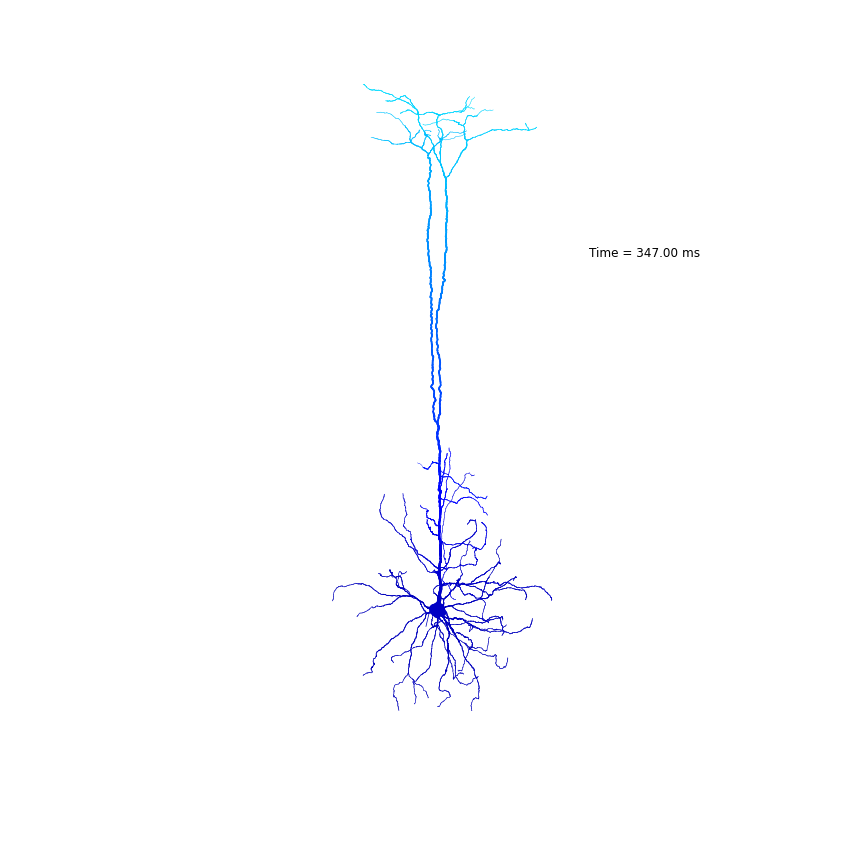
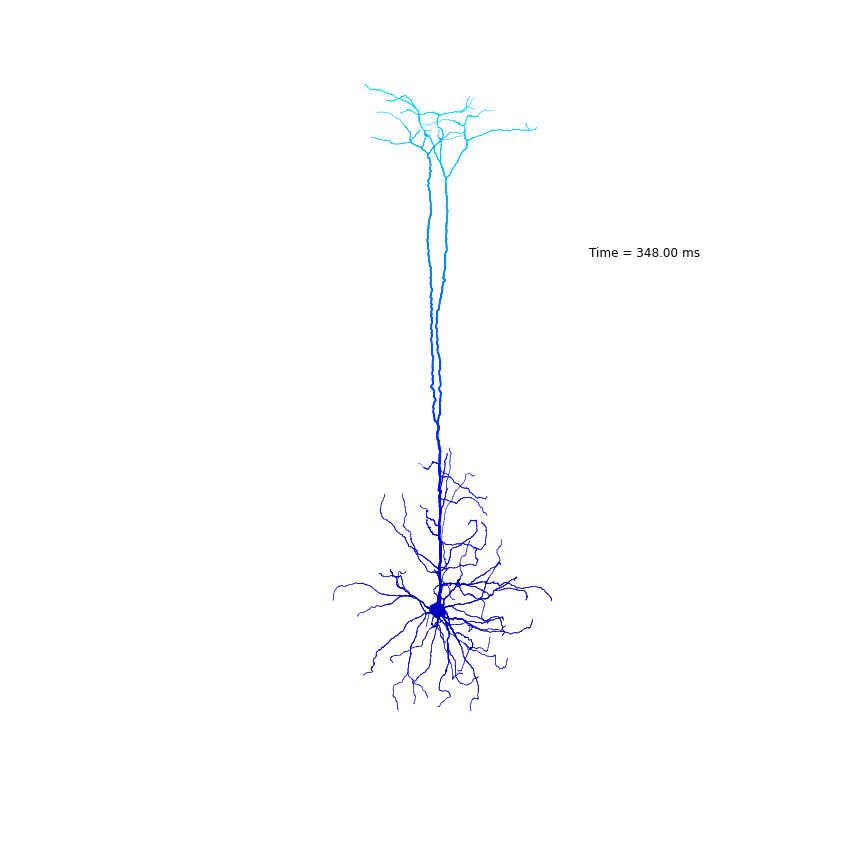
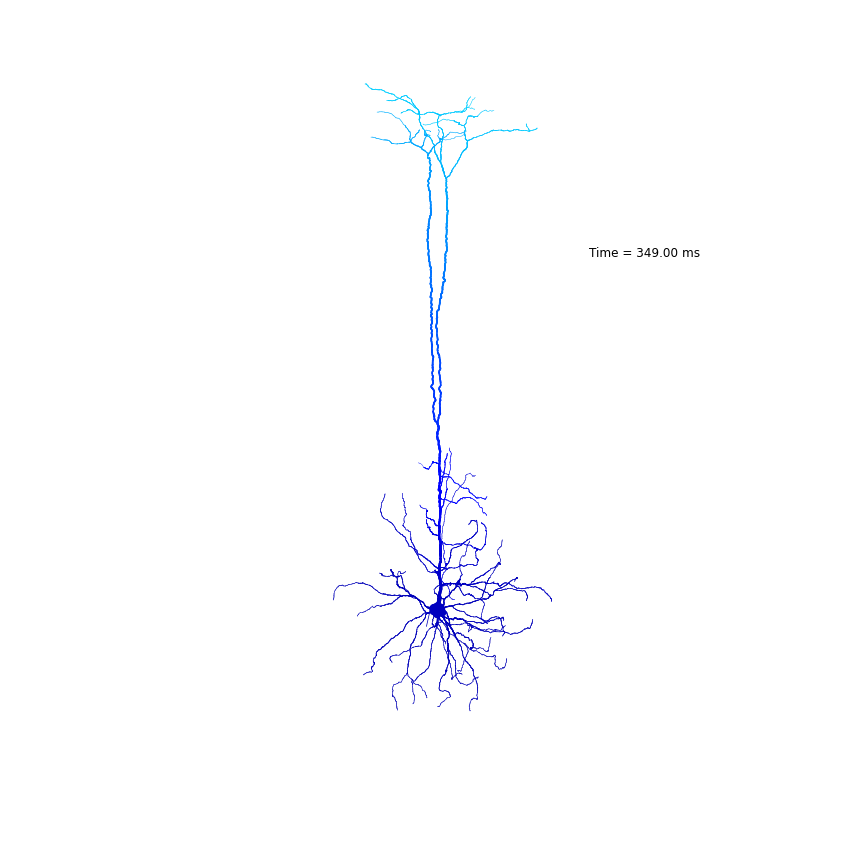
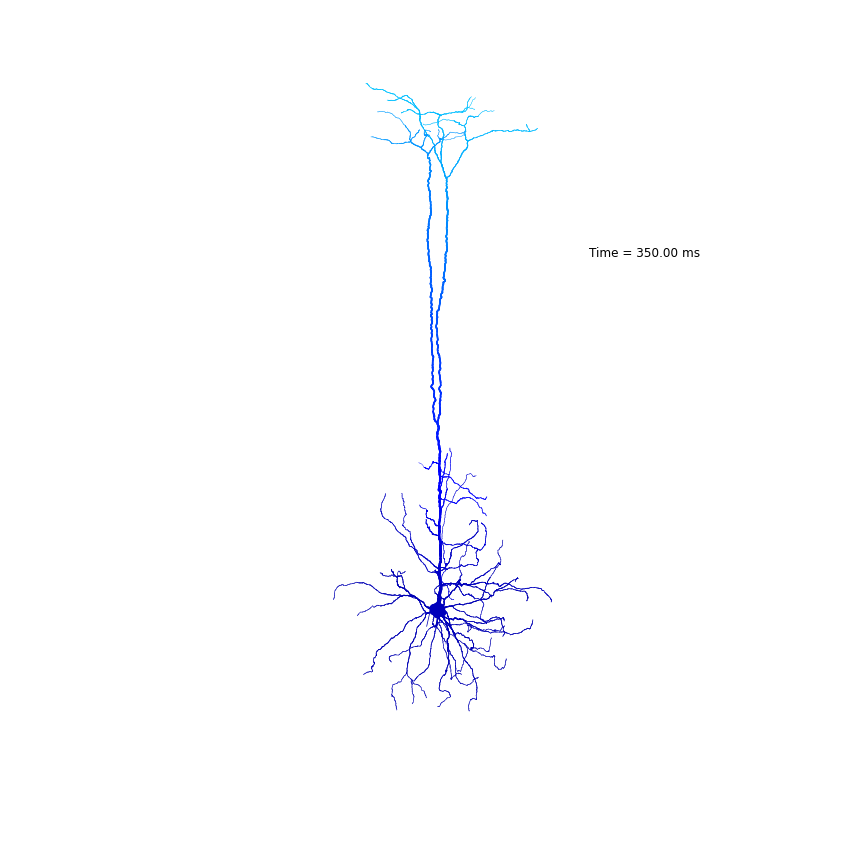

In [13]:
client = I.get_client()
outdir = I.os.path.join(db.basedir, 'burst_trail_video_3d')
    
cmv = I.CellMorphologyVisualizer(
    cell, 
    t_start=295,    # Don't load all simulation data, only the interesting part
    t_stop=350,     # these are in [ms]
    t_step=1)
cmv.animation(
    images_path=outdir,
    show_legend=True,
    color="voltage",
    client=client,
    overwrite_frames=True);

These visualization aren't limited to just the membrane voltage either! Let's visualize some current flowing through one specific ion channel. 

### Animating ion currents

We can also visualize current through ion channels. Let's have a look at the calcium current through low voltage activated calcium channels:

Ca_LVAst.ica membrane current



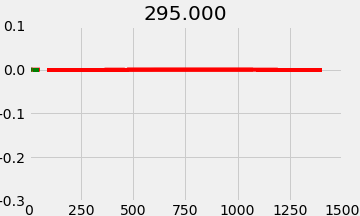
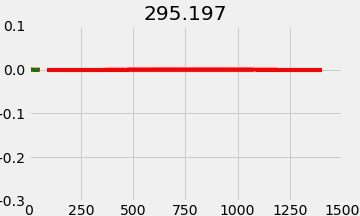
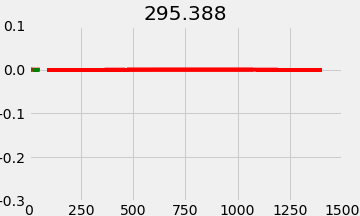
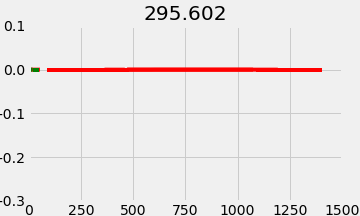
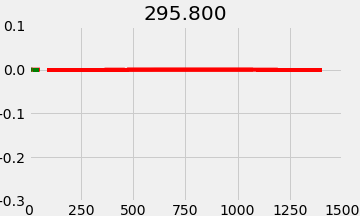
...
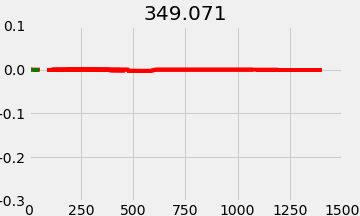
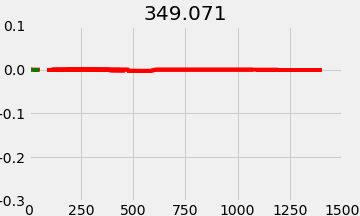
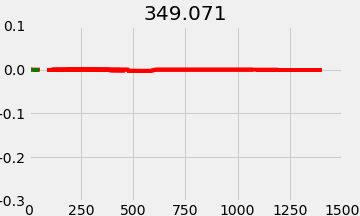
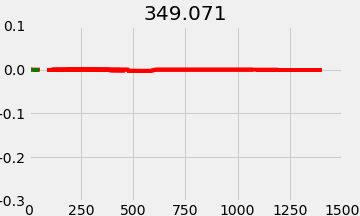
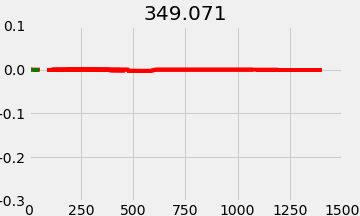

In [14]:
# # to re-create this video, comment out below
# del db['burst_trail_ca_current_video']

range_var = 'Ca_LVAst.ica'

if not 'burst_trail_ca_current_video' in db.keys():
    I.cell_to_animation(
        cell,
        xlim = [0,1500],
        ylim = [-0.3, 0.1],
        tstart = 295,
        tend = 350,
        tstep = 0.2,
        outdir = db.create_managed_folder('burst_trail_ca_current_video'),
        range_vars = range_var)    

print("{} membrane current".format(range_var))
I.display_animation(db['burst_trail_ca_current_video'].join('*', '*png'), embedded = True);


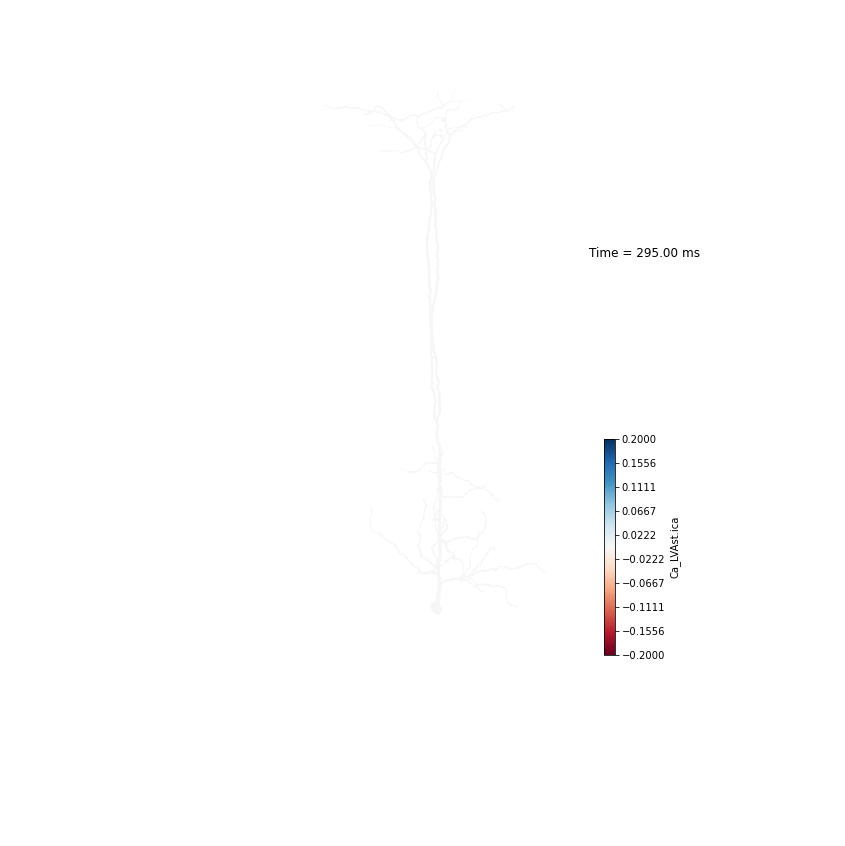
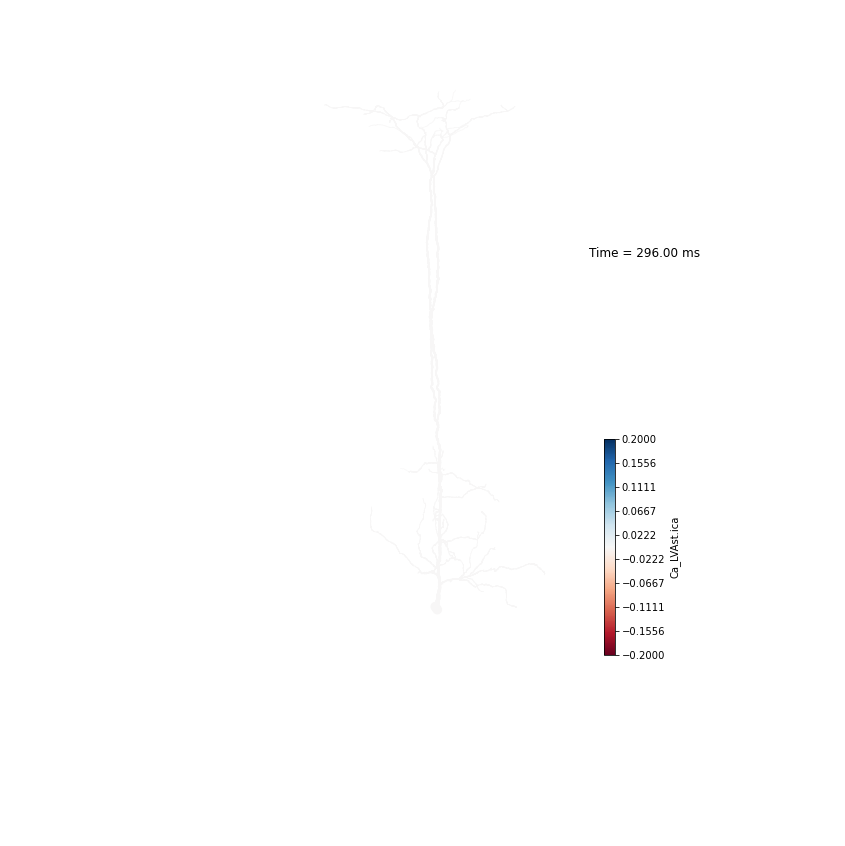
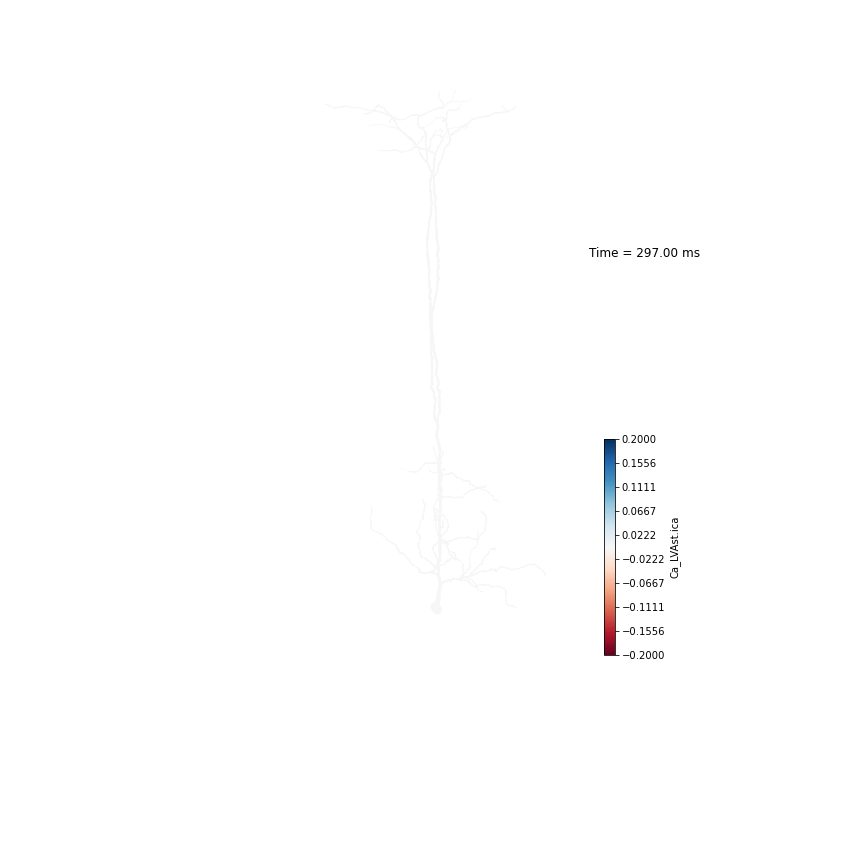
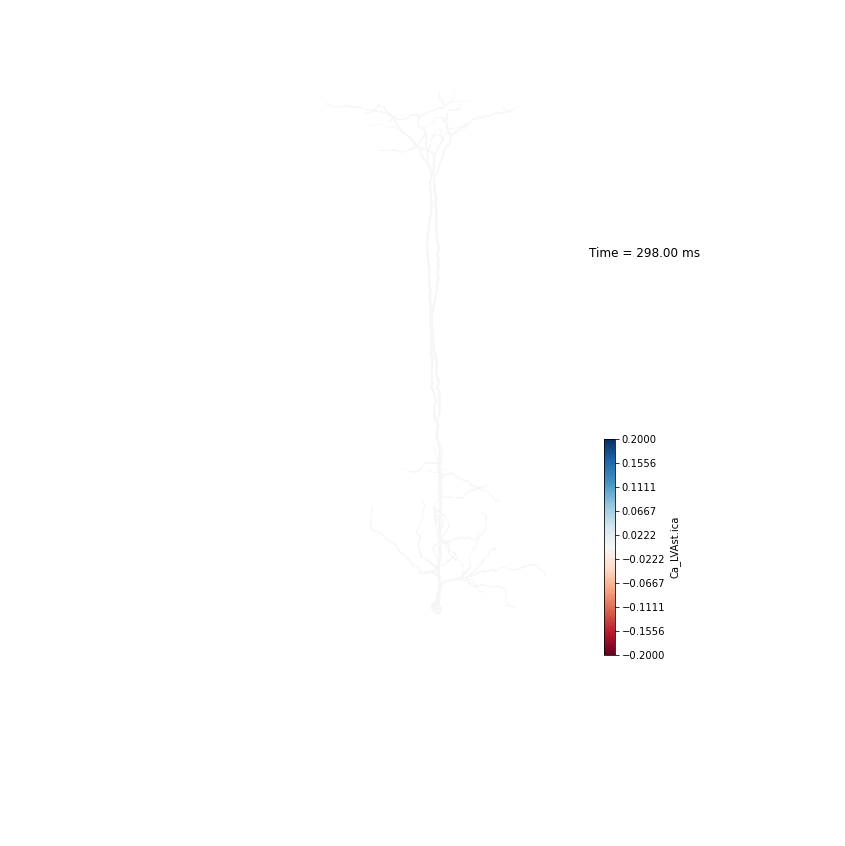
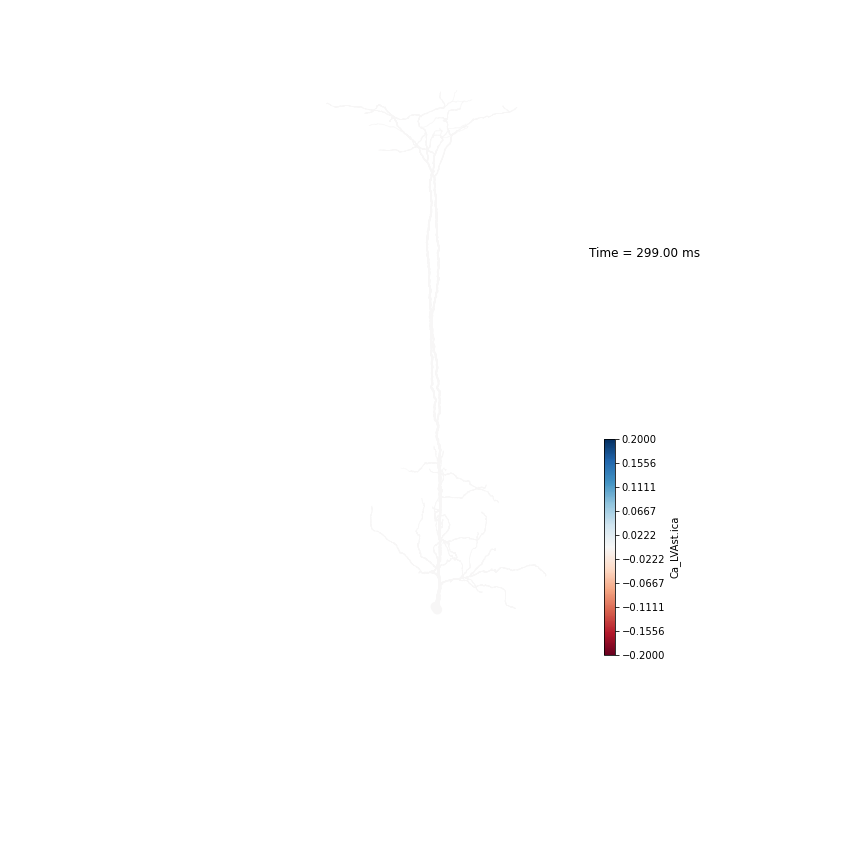
...
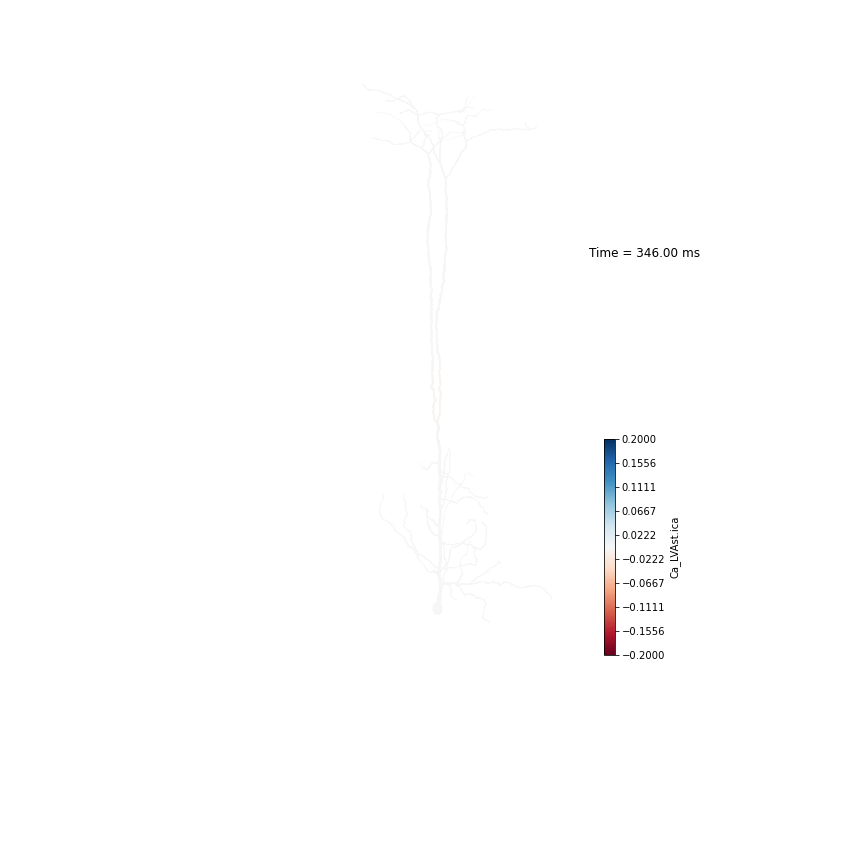
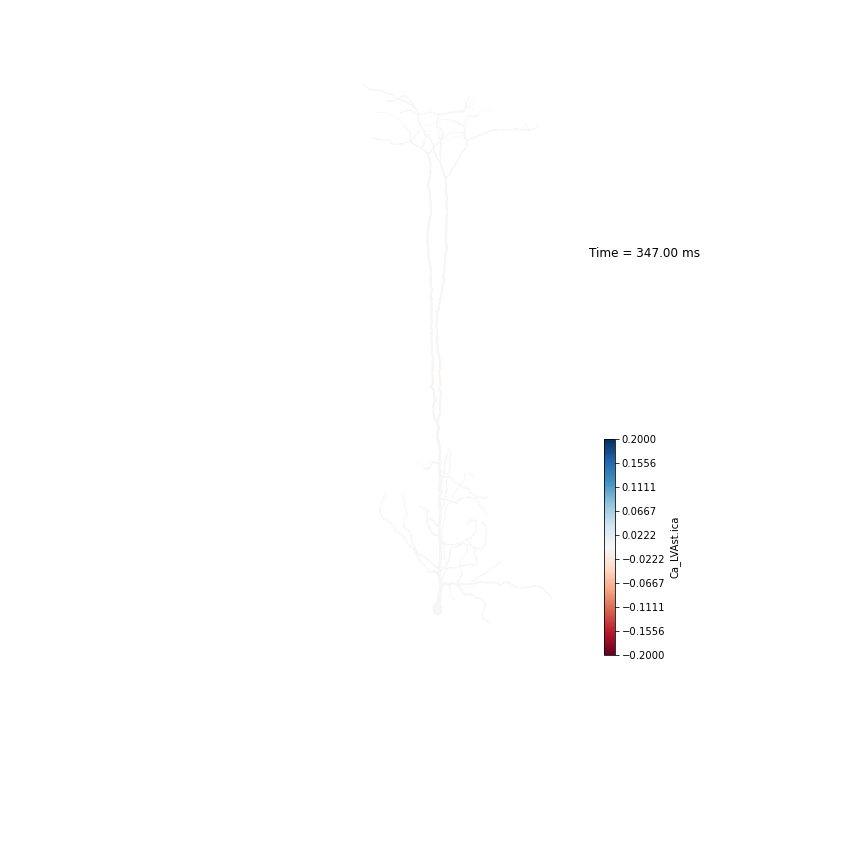
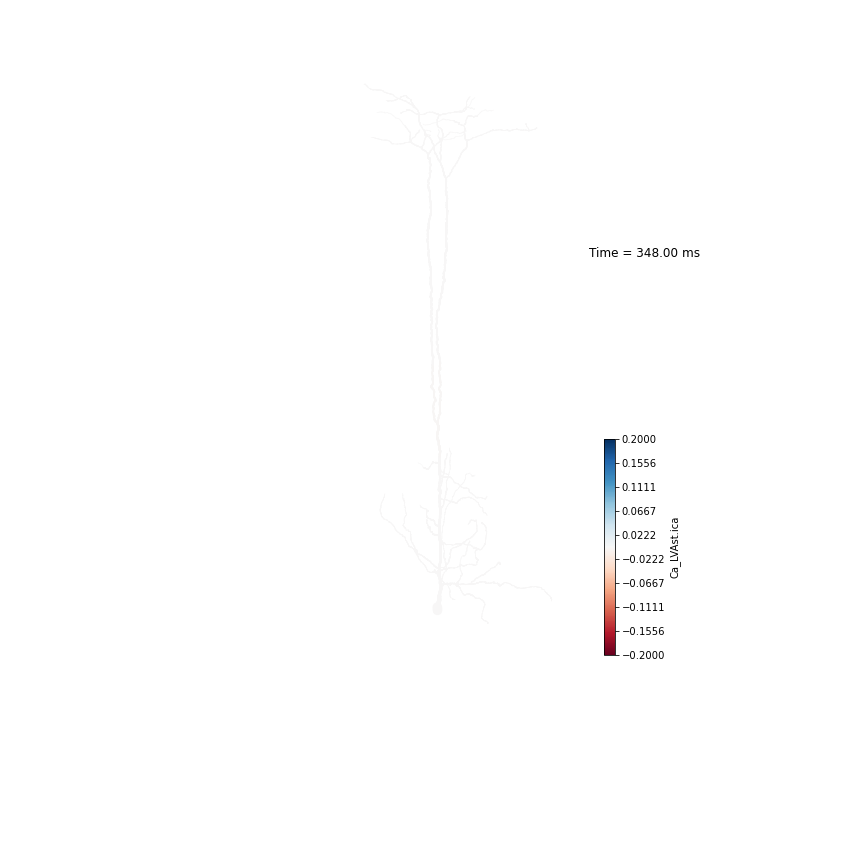
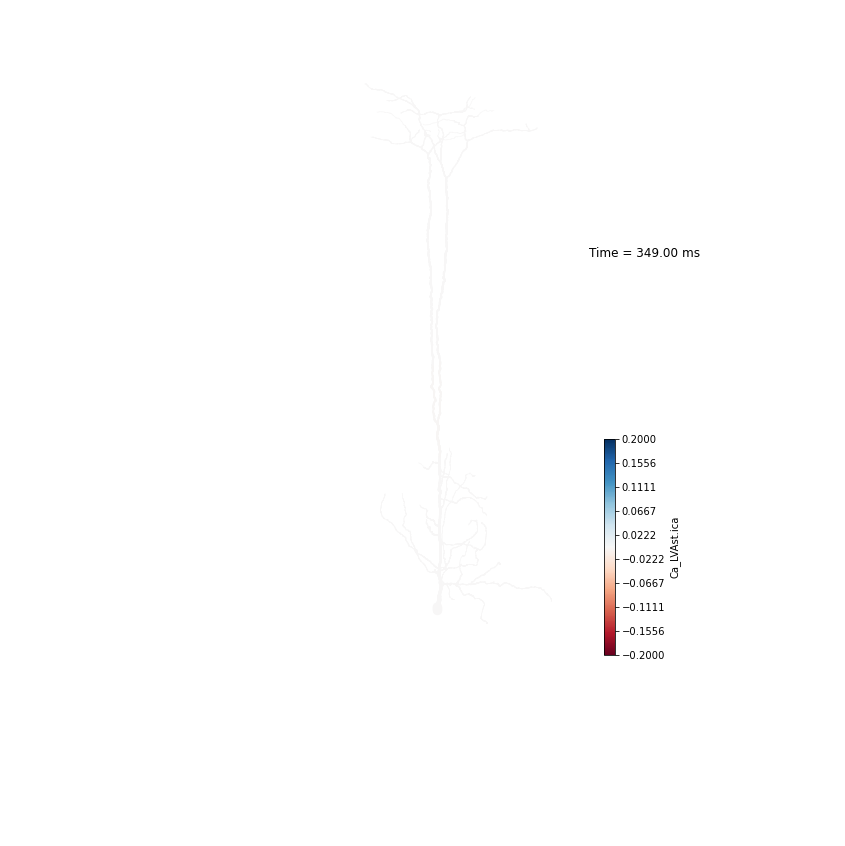
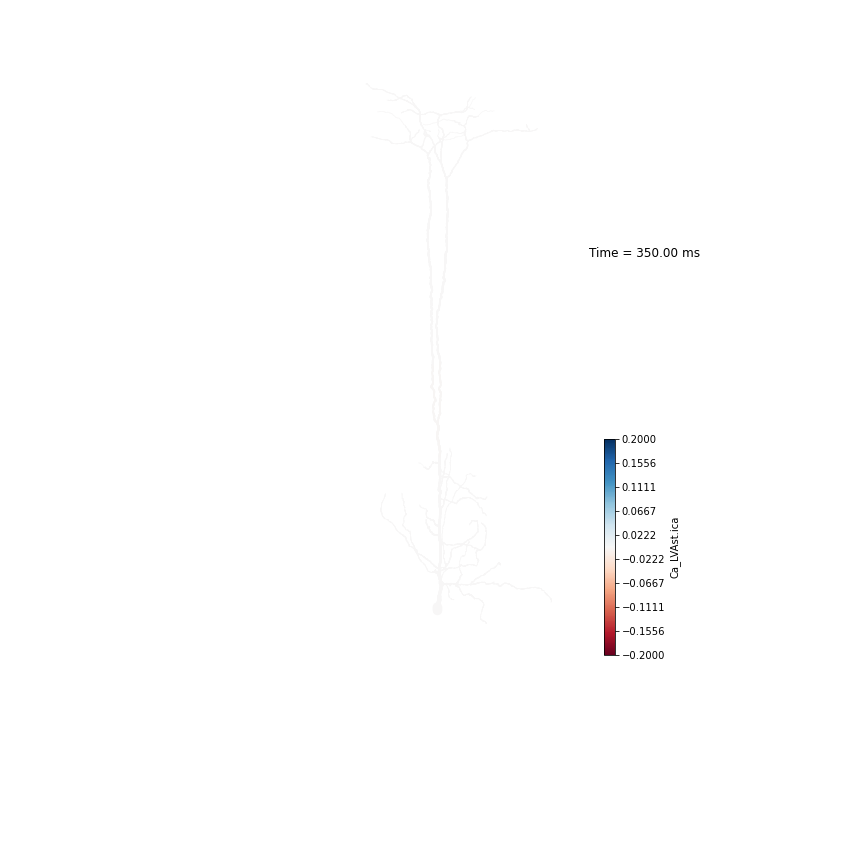

In [15]:
outdir = I.os.path.join(db.basedir, 'Ca_LVAst_video_3d')
    
cmv.set_cmap("RdBu", vmin=-2e-1, vmax=2e-1)  # more visible 
cmv.animation(
    images_path=outdir,
    color="Ca_LVAst.ica",
    show_legend=True,
    client=client,
    overwrite_frames=True);

In the visualization above, not all dendrites are shown, because not all dendrites contain this ion channel.

## Recap

We have seen how to run simulations in [Tutorial 1.3](./1.1%20Simulation.ipynb) and how to evaluate the results of these simulation here.
Now, we have all the necessary tools to start building neuron models from scratch. This will be shown in the [next tutorial](./1.3%20Generation.ipynb).

